<a href="https://colab.research.google.com/github/eskutza/AnalisisPredictivo/blob/main/tree/main/colab/EDA_Tarea_01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center>

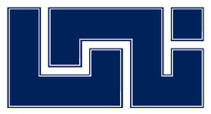

</center>

<h1><b>
Dirección de Estudios de Posgrado y Educación Continua
<h2><b>
Analítica Predictiva y Machine Learning con R, Python y Databricks

[UNI-DEPEC](https://posgrado.uni.edu.ni)

~~~Python
Iranzuegi López, Luis Ángel
~~~

# **Tarea Modelos Supervisados**

# **Modelo de Clasificación**: <font color="#0A66C2"><h10>**EDA** <font> 

# **Carga de librerías necesarias**

## <font color="#333F49"> **Para el análisis de datos y el conjunto de datos** <font>

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## <font color="#333F49">**Para el modelado inicial, base**<font>

In [ ]:
!pip install pycaret

In [ ]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


## <font color="#333F49">**Para el preprocesado y modelado** <font>


In [ ]:
from sklearn.preprocessing import OneHotEncoder
import sklearn.metrics as metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import seaborn as sns

## <font color="#333F49">**Para los gráficos** <font>

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px

## <font color="#333F49">**Para serializar: grabar y recuperar los modelos entrenados** <font>

In [ ]:
import pickle 
import os

## <font color="#333F49">**Para las alertas** <font>

In [ ]:
import warnings
warnings.filterwarnings('ignore')

#**Análisis Exploratorio de los Datos y Preprocesamiento de Datos**

## <font color="#333F49">**Descripción del set de datos** <font>

Los $datos^1$ están relacionados con campañas de marketing directo de una institución bancaria portuguesa.

Las campañas de marketing se han basado en llamadas telefónicas. A menudo, ha sido necesario más de un contacto con el mismo cliente, clienta para poder detectar si estaba (o no) interesado en la contratación  de un producto (depósito a plazo bancario).

<font color="#666666">
<h10>
 (1) Fuente: S. Moro, R. Laureano y P. Cortez. Uso de la minería de datos para el marketing directo bancario: una aplicación de la metodología CRISP-DM
</font>

[Uso de la minería de datos para el marketing directo bancario]( http://repositorium.sdum.uminho.pt/handle/1822/14838)



**Objetivo:** 

Definir un modelo que pueda explicar el éxito de un contacto, es decir, si el o la clienta suscribe el depósito. 

Aumentar la eficacia de la campaña al identificar las principales características que afectan al éxito, ayudando a una mejor gestión de los recursos disponibles (por ejemplo, el esfuerzo humano en llamadas telefónicas, tiempo) y la selección de un conjunto de clientes, clientas potenciales
compradoras.



El dataframe contiene 17 variables y 45211 observaciones.

Las variables se definen como:
- **age:** Edad de los y las clientas; variable numérica
- **job:** Corresponde al tipo de trabajo de los y las clientas; variable categórica
- **marital:** Estado civil de los y las clientas; variable categórica. A tener en cuenta, divorciado, divorciada recoge también las opciones de viudo o viuda
- **education:** Nivel de estudios que han alcanzado los y las clientas; variable categórica. A tener en cuenta que uno de los valores de esta variable es <font color="#0A66C2"><h10>"desconocido"<font> 


- **default:** Si el o la clienta tiene algún no o está al corriente de sus comprosimos creditíceos con la entidad; variable dicotómica
- **balance:** saldo anual medio en euros: variable numérica
- **housing:** Si el o la clienta tiene algún crédito hipotecario con la entidad; variable dicotómica
- **loan:** Si el o la clienta tiene algún crédito consumo con la entidad; variable dicotómica
- **contact:** Tipo de contacto; variable categórica. A tener en cuenta que uno de los valores de esta variable es <font color="#0A66C2"><h10>"desconocido"<font> 


- **day:** Último día de contacto del mes; varible numérica
- **month:** Último mes de contacto del año; varible categórica
- **duration:** Duración del último contacto en segundos; variable numérica
- **campaign:** Número de contactos realizados durante la campaña para cada cliente, clienta; variable numérica
- **pdays:** Número de días que pasaron después de que el o la clienta fue contactado por última vez desde una campaña anterior; variable numérica. A tener en cuenta, un valor de -1 significa que el cliente fue no contactado previamente
- **previous:** Número de contactos realizados antes de esta campaña y para este cliente, clienta; variable numérica
- **poutcome:** Resultado de la campaña de marketing anterior; variable categórica. A tener en cuenta que uno de los valores de esta variable es <font color="#0A66C2"><h10>"desconocido"<font> 


- **y:** ¿El o la clienta ha suscrito un depósito a plazo? <font color="#0A66C2"><h10>"**nuestra variable objetivo o variable respuesta**"<font> 

In [ ]:
url = "https://raw.githubusercontent.com/eskutza/AnalisisPredictivo/main/Datasets/bank-full.csv"

In [ ]:
df = pd.read_csv(url, sep =';')
df


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [ ]:
df.index

RangeIndex(start=0, stop=45211, step=1)

In [ ]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'y'],
      dtype='object')

In [ ]:
df.shape

(45211, 17)

In [ ]:
df.size

768587

## <font color="#333F49">**Valores únicos por variable** <font>

In [ ]:
df.nunique() 

age            77
job            12
marital         3
education       4
default         2
balance      7168
housing         2
loan            2
contact         3
day            31
month          12
duration     1573
campaign       48
pdays         559
previous       41
poutcome        4
y               2
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [ ]:
df.age.unique()

array([58, 44, 33, 47, 35, 28, 42, 43, 41, 29, 53, 57, 51, 45, 60, 56, 32,
       25, 40, 39, 52, 46, 36, 49, 59, 37, 50, 54, 55, 48, 24, 38, 31, 30,
       27, 34, 23, 26, 61, 22, 21, 20, 66, 62, 83, 75, 67, 70, 65, 68, 64,
       69, 72, 71, 19, 76, 85, 63, 90, 82, 73, 74, 78, 80, 94, 79, 77, 86,
       95, 81, 18, 89, 84, 87, 92, 93, 88])

In [ ]:
df.age.value_counts()

32    2085
31    1996
33    1972
34    1930
35    1894
      ... 
90       2
92       2
93       2
95       2
94       1
Name: age, Length: 77, dtype: int64

In [ ]:
df.job.unique()

array(['management', 'technician', 'entrepreneur', 'blue-collar',
       'unknown', 'retired', 'admin.', 'services', 'self-employed',
       'unemployed', 'housemaid', 'student'], dtype=object)

In [ ]:
df.job.value_counts() # 288 observaciones con una valor de "unknown"

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

In [ ]:
df.marital.unique()

array(['married', 'single', 'divorced'], dtype=object)

In [ ]:
df.marital.value_counts()

married     27214
single      12790
divorced     5207
Name: marital, dtype: int64

In [ ]:
df.education.unique()

array(['tertiary', 'secondary', 'unknown', 'primary'], dtype=object)

In [ ]:
df.education.value_counts() # 1857 observaciones con una valor de "unknown"

secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64

In [ ]:
df.default.unique()

array(['no', 'yes'], dtype=object)

In [ ]:
df.default.value_counts() # Un 2% de las observaciones en esta variable arroja un valor de si

no     44396
yes      815
Name: default, dtype: int64

In [ ]:
df.balance.unique()

array([ 2143,    29,     2, ...,  8205, 14204, 16353])

In [ ]:
df.balance.value_counts()

0        3514
1         195
2         156
4         139
3         134
         ... 
4305        1
6352        1
18881       1
14889       1
7218        1
Name: balance, Length: 7168, dtype: int64

In [ ]:
df.housing.unique()

array(['yes', 'no'], dtype=object)

In [ ]:
df.housing.value_counts()

yes    25130
no     20081
Name: housing, dtype: int64

In [ ]:
df.loan.unique()

array(['no', 'yes'], dtype=object)

In [ ]:
df.loan.value_counts()

no     37967
yes     7244
Name: loan, dtype: int64

In [ ]:
df.contact.unique()

array(['unknown', 'cellular', 'telephone'], dtype=object)

In [ ]:
df.contact.value_counts() # 13020 observaciones con una valor de "unknown"

cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64

In [ ]:
df.day.unique()

array([ 5,  6,  7,  8,  9, 12, 13, 14, 15, 16, 19, 20, 21, 23, 26, 27, 28,
       29, 30,  2,  3,  4, 11, 17, 18, 24, 25,  1, 10, 22, 31])

In [ ]:
df.day.value_counts()

20    2752
18    2308
21    2026
17    1939
6     1932
5     1910
14    1848
8     1842
28    1830
7     1817
19    1757
29    1745
15    1703
12    1603
13    1585
30    1566
9     1561
11    1479
4     1445
16    1415
2     1293
27    1121
3     1079
26    1035
23     939
22     905
25     840
31     643
10     524
24     447
1      322
Name: day, dtype: int64

In [ ]:
df.month.unique()

array(['may', 'jun', 'jul', 'aug', 'oct', 'nov', 'dec', 'jan', 'feb',
       'mar', 'apr', 'sep'], dtype=object)

In [ ]:
df.month.value_counts()

may    13766
jul     6895
aug     6247
jun     5341
nov     3970
apr     2932
feb     2649
jan     1403
oct      738
sep      579
mar      477
dec      214
Name: month, dtype: int64

In [ ]:
df.duration.unique()

array([ 261,  151,   76, ..., 1298, 1246, 1556])

In [ ]:
df.duration.value_counts()

124     188
90      184
89      177
122     175
104     175
       ... 
2150      1
1970      1
1906      1
1842      1
2015      1
Name: duration, Length: 1573, dtype: int64

In [ ]:
df.campaign.unique()

array([ 1,  2,  3,  5,  4,  6,  7,  8,  9, 10, 11, 12, 13, 19, 14, 24, 16,
       32, 18, 22, 15, 17, 25, 21, 43, 51, 63, 41, 26, 28, 55, 50, 38, 23,
       20, 29, 31, 37, 30, 46, 27, 58, 33, 35, 34, 36, 39, 44])

In [ ]:
df.campaign.value_counts()

1     17544
2     12505
3      5521
4      3522
5      1764
6      1291
7       735
8       540
9       327
10      266
11      201
12      155
13      133
14       93
15       84
16       79
17       69
18       51
19       44
20       43
21       35
22       23
23       22
25       22
24       20
28       16
29       16
26       13
31       12
27       10
32        9
30        8
33        6
34        5
36        4
35        4
43        3
38        3
41        2
50        2
37        2
51        1
55        1
46        1
58        1
44        1
39        1
63        1
Name: campaign, dtype: int64

In [ ]:
df.pdays.unique()

array([ -1, 151, 166,  91,  86, 143, 147,  89, 140, 176, 101, 174, 170,
       167, 195, 165, 129, 188, 196, 172, 118, 119, 104, 171, 117, 164,
       132, 131, 123, 159, 186, 111, 115, 116, 173, 178, 110, 152,  96,
       103, 150, 175, 193, 181, 185, 154, 145, 138, 126, 180, 109, 158,
       168,  97, 182, 127, 130, 194, 125, 105, 102,  26, 179,  28, 183,
       155, 112, 120, 137, 124, 187, 190, 113, 162, 134, 169, 189,   8,
       144, 191, 184, 177,   5,  99, 133,  93,  92,  10, 100, 156, 198,
       106, 153, 146, 128,   7, 121, 160, 107,  90,  27, 197, 136, 139,
       122, 157, 149, 135,  30, 114,  98, 192, 163,  34,  95, 141,  31,
       199,  94, 108,  29, 268, 247, 253, 226, 244, 239, 245, 204, 231,
       238, 258, 230, 254, 265,  71, 223, 246, 250, 266, 240, 205, 261,
       259, 241, 260, 234, 251, 225, 161, 237, 262, 248, 255, 220, 227,
       206, 224, 249, 235, 228, 263,   2, 270, 232, 252, 207, 200, 269,
       233, 256, 273, 272, 242, 264, 208, 214, 222, 271, 203, 22

In [ ]:
df.pdays.value_counts()

-1      36954
 182      167
 92       147
 183      126
 91       126
        ...  
 749        1
 717        1
 589        1
 493        1
 32         1
Name: pdays, Length: 559, dtype: int64

In [ ]:
df.previous.unique()

array([  0,   3,   1,   4,   2,  11,  16,   6,   5,  10,  12,   7,  18,
         9,  21,   8,  14,  15,  26,  37,  13,  25,  20,  27,  17,  23,
        38,  29,  24,  51, 275,  22,  19,  30,  58,  28,  32,  40,  55,
        35,  41])

In [ ]:
df.previous.value_counts()

0      36954
1       2772
2       2106
3       1142
4        714
5        459
6        277
7        205
8        129
9         92
10        67
11        65
12        44
13        38
15        20
14        19
17        15
16        13
19        11
23         8
20         8
22         6
18         6
24         5
27         5
29         4
25         4
21         4
30         3
28         2
26         2
37         2
38         2
55         1
40         1
35         1
58         1
51         1
41         1
32         1
275        1
Name: previous, dtype: int64

In [ ]:
df.poutcome.unique()

array(['unknown', 'failure', 'other', 'success'], dtype=object)

In [ ]:
df.poutcome.value_counts() # 82% de las observaciones con una valor de "unknown"

unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome, dtype: int64

In [ ]:
df.y.unique()

array(['no', 'yes'], dtype=object)

In [ ]:
df.y.value_counts()

no     39922
yes     5289
Name: y, dtype: int64

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


In [ ]:
df.select_dtypes(include=['object']).describe().T

,count,unique,top,freq
job,45211,12,blue-collar,9732
marital,45211,3,married,27214
education,45211,4,secondary,23202
default,45211,2,no,44396
housing,45211,2,yes,25130
loan,45211,2,no,37967
contact,45211,3,cellular,29285
month,45211,12,may,13766
poutcome,45211,4,unknown,36959
y,45211,2,no,39922


Si alguno de los niveles de una **variable cualitativa** tiene **muy pocas observaciones** en comparación a los otros niveles, puede ocurrir que, durante la validación cruzada, algunas particiones no contengan ninguna observación de dicha clase (varianza cero), lo que puede dar lugar a errores. 

**Estrategias posibles**:
- Eliminar las observaciones del grupo minoritario si es una variable multiclase.
- Eliminar la variable si solo tiene dos niveles.
- Agrupar los niveles minoritarios en un único grupo.
- Asegurar que, en la creación de las particiones, todos los grupos estén representados en cada una de ellas.

Para este caso, hay que tener precaución con la variable <font color="#0A66C2"><h10> **default**. En concreto, tan solo un 2% de las observaciones de esta variable arroja un valor de si, siendo no el 98% restante. <font>

## <font color="#333F49">**Reemplazar "unknown"** <font>


In [ ]:
df.replace({'unknown': None}, inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        44923 non-null  object
 2   marital    45211 non-null  object
 3   education  43354 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    32191 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   8252 non-null   object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [ ]:
df.isnull().sum().sort_values(ascending=False)

poutcome     36959
contact      13020
education     1857
job            288
loan             0
marital          0
default          0
balance          0
housing          0
y                0
day              0
month            0
duration         0
campaign         0
pdays            0
previous         0
age              0
dtype: int64

## <font color="#333F49">**Codificación** <font>


### Variables categóricas de tipo ordinal <font color="#0A66C2"><h10>**(job)** <font>

Desconocemos el orden de esta variable, pero es evidente que cara a la compresión, se establecerá una lógica de mayor a menor poder adquisitivo, basado en el salario medio que percibe cada tipo de trabajo definido.

Podemos establecer como criterio de ordenación, el tipo de trabajo en función del balance. A mayor balance, mayor interés para la entidad financiera, mayores recursos disponibles por parte de los y las clientas.

In [ ]:
df1 = df.copy(deep=False)

In [ ]:
df1.groupby(by = 'job', as_index = False).mean().sort_values(by ='balance',ascending=False)

,job,age,balance,day,duration,campaign,pdays,previous
5,retired,61.626767,1984.215106,15.439488,287.361307,2.346731,37.443905,0.638693
4,management,40.449567,1763.616832,16.114189,253.995771,2.864348,38.665468,0.668006
6,self-employed,40.484484,1647.970868,16.027866,268.157061,2.853072,34.747308,0.551615
10,unemployed,40.961627,1521.745971,15.498081,288.543361,2.432080,34.146585,0.466616
2,entrepreneur,42.190989,1521.470074,15.702085,256.309348,2.799597,32.486214,0.478144
3,housemaid,46.415323,1392.395161,16.002419,245.825000,2.820968,21.505645,0.371774
8,student,26.542644,1388.060768,14.897655,246.656716,2.299574,57.041578,0.953092
9,technician,39.314598,1252.632092,16.408582,252.904962,2.906805,37.195077,0.574569
0,admin.,39.289886,1135.838909,15.564301,246.896732,2.575324,47.859021,0.671630
1,blue-collar,40.044081,1078.826654,15.442561,262.901562,2.816995,44.033498,0.505138


Con esta primera aproximación, se decide aplicar una corrección en el orden de los tipos de ocupación recogidos en aquellas tipologías que no impliquen actividad ocupacional (student, unemployed)

In [ ]:
from sklearn.preprocessing import OrdinalEncoder

In [ ]:
encoder = OrdinalEncoder(categories=[[None,'unemployed', 'student', 'housemaid',
                                      'services','blue-collar','admin.',
                                      'technician','entrepreneur',  
                                      'self-employed', 'management','retired']],
                         dtype = np.int64)

In [ ]:
encoder.fit(df1[['job']])
df1.insert(2, column ='job_encoded', 
           value = encoder.transform(df[['job']]))


In [ ]:
df1

,age,job,job_encoded,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,10,married,tertiary,no,2143,yes,no,None,5,may,261,1,-1,0,None,no
1,44,technician,7,single,secondary,no,29,yes,no,None,5,may,151,1,-1,0,None,no
2,33,entrepreneur,8,married,secondary,no,2,yes,yes,None,5,may,76,1,-1,0,None,no
3,47,blue-collar,5,married,None,no,1506,yes,no,None,5,may,92,1,-1,0,None,no
4,33,None,0,single,None,no,1,no,no,None,5,may,198,1,-1,0,None,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,7,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,None,yes
45207,71,retired,11,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,None,yes
45208,72,retired,11,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,5,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,None,no


In [ ]:
df1.job.value_counts(dropna= False)

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
NaN               288
Name: job, dtype: int64

In [ ]:
df1.job_encoded.value_counts()

5     9732
10    9458
7     7597
6     5171
4     4154
11    2264
9     1579
8     1487
1     1303
3     1240
2      938
0      288
Name: job_encoded, dtype: int64

### Variables categóricas de tipo ordinal <font color="#0A66C2"><h10>**(education)** <font>

In [ ]:
encoder2 = OrdinalEncoder(categories=[[None,'primary', 'secondary', 'tertiary']],
                         dtype = np.int64)

In [ ]:
encoder2.fit(df1[['education']])
df1.insert(5, column ='education_encoded', 
           value = encoder2.transform(df[['education']]))

In [ ]:
df1

,age,job,job_encoded,marital,education,education_encoded,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,10,married,tertiary,3,no,2143,yes,no,None,5,may,261,1,-1,0,None,no
1,44,technician,7,single,secondary,2,no,29,yes,no,None,5,may,151,1,-1,0,None,no
2,33,entrepreneur,8,married,secondary,2,no,2,yes,yes,None,5,may,76,1,-1,0,None,no
3,47,blue-collar,5,married,None,0,no,1506,yes,no,None,5,may,92,1,-1,0,None,no
4,33,None,0,single,None,0,no,1,no,no,None,5,may,198,1,-1,0,None,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,7,married,tertiary,3,no,825,no,no,cellular,17,nov,977,3,-1,0,None,yes
45207,71,retired,11,divorced,primary,1,no,1729,no,no,cellular,17,nov,456,2,-1,0,None,yes
45208,72,retired,11,married,secondary,2,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,5,married,secondary,2,no,668,no,no,telephone,17,nov,508,4,-1,0,None,no


In [ ]:
df1.education.value_counts(dropna=False)

secondary    23202
tertiary     13301
primary       6851
NaN           1857
Name: education, dtype: int64

In [ ]:
df1.education_encoded.value_counts(dropna = False)

2    23202
3    13301
1     6851
0     1857
Name: education_encoded, dtype: int64

### Variable categórica <font color="#0A66C2"><h10>**(contact)** <font>

El objetivo de implementar un modelo de aprendizaje supervisado de **clasificación** es predecir el éxito de un contacto, es decir, si el o la clienta suscribe el depósito. Por lo tanto, podemos concluir que todos los y las clientas del set datos han sido contactados por la entidad financiera. 

En este sentido, a modo de conclusión incial, teniendo en cuenta el número de observaciones que no cuentan con tipo de contacto asignado, sería conveniente cara a futuras campañas chequear cómo se recoge este aspecto, pudiendo abrir otras altenativas de canales telemáticos, presenciales (oficina), etc...

Es por ello, que consideramos o, mejor dicho, codificaremos esas observaciones que vienen marcadas con un "unknown" en esta variable como otros canales de contacto (others)

In [ ]:
df1['contact'].replace({None: 'others'}, inplace = True)

In [ ]:
df1['contact'].value_counts()

cellular     29285
others       13020
telephone     2906
Name: contact, dtype: int64

### Variables categóricas a numéricas <font color="#0A66C2"><h10>**(LabelEncoder)** <font>

Convertiremos a string las columnas necesarias para poder aplicar LabelEncoder( ).

Las variables categóricas sobre las que implementaremos la codificación:
- **marital**
- **default**
- **housing**
- **loan**
- **poutcome**
- **y** <font color="#0A66C2"><h10> **(varibale objetivo)** <font>

In [ ]:
df1.marital = df1.marital.apply(str)
df1.default = df1.default.apply(str)
df1.housing = df1.housing.apply(str)
df1.loan = df1.loan.apply(str)
df1.poutcome = df1.poutcome.apply(str)
df1.y = df1.y.apply(str)

In [ ]:
df1

,age,job,job_encoded,marital,education,education_encoded,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,10,married,tertiary,3,no,2143,yes,no,others,5,may,261,1,-1,0,None,no
1,44,technician,7,single,secondary,2,no,29,yes,no,others,5,may,151,1,-1,0,None,no
2,33,entrepreneur,8,married,secondary,2,no,2,yes,yes,others,5,may,76,1,-1,0,None,no
3,47,blue-collar,5,married,None,0,no,1506,yes,no,others,5,may,92,1,-1,0,None,no
4,33,None,0,single,None,0,no,1,no,no,others,5,may,198,1,-1,0,None,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,7,married,tertiary,3,no,825,no,no,cellular,17,nov,977,3,-1,0,None,yes
45207,71,retired,11,divorced,primary,1,no,1729,no,no,cellular,17,nov,456,2,-1,0,None,yes
45208,72,retired,11,married,secondary,2,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,5,married,secondary,2,no,668,no,no,telephone,17,nov,508,4,-1,0,None,no


In [ ]:
import sklearn 
from sklearn.preprocessing import LabelEncoder

In [ ]:
convertir = LabelEncoder()

In [ ]:
df1.insert(4,column='nummarital',value=convertir.fit_transform(df1.marital))
df1.insert(8,column='numdefault',value=convertir.fit_transform(df1.default))
df1.insert(11,column='numhousing',value=convertir.fit_transform(df1.housing))
df1.insert(13,column='numloan',value=convertir.fit_transform(df1.loan))
df1.insert(22,column='numpoutcome',value=convertir.fit_transform(df1.poutcome))
df1.insert(24,column='numy',value=convertir.fit_transform(df1.y))

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   age                45211 non-null  int64 
 1   job                44923 non-null  object
 2   job_encoded        45211 non-null  int64 
 3   marital            45211 non-null  object
 4   nummarital         45211 non-null  int64 
 5   education          43354 non-null  object
 6   education_encoded  45211 non-null  int64 
 7   default            45211 non-null  object
 8   numdefault         45211 non-null  int64 
 9   balance            45211 non-null  int64 
 10  housing            45211 non-null  object
 11  numhousing         45211 non-null  int64 
 12  loan               45211 non-null  object
 13  numloan            45211 non-null  int64 
 14  contact            45211 non-null  object
 15  day                45211 non-null  int64 
 16  month              45211 non-null  objec

## <font color="#333F49"> **Imputaciones (el vecino más cercano)** <font>

In [ ]:
!pip install missingpy

In [ ]:
from missingpy import KNNImputer

In [ ]:
imputacion = KNNImputer(n_neighbors=2, missing_values=0, weights='uniform')

### Imputación de NaN de la variable job (n=288)

In [ ]:
df1.job_encoded = imputacion.fit_transform(df1[['job_encoded']])

In [ ]:
df1.job_encoded.value_counts()

5.000000     9732
10.000000    9458
7.000000     7597
6.000000     5171
4.000000     4154
11.000000    2264
9.000000     1579
8.000000     1487
1.000000     1303
3.000000     1240
2.000000      938
6.721969      288
Name: job_encoded, dtype: int64

In [ ]:
df1['job'][(df1['job_encoded']>6) & 
           (df1['job_encoded']<7)]='technician'

In [ ]:
df1.job.value_counts()

blue-collar      9732
management       9458
technician       7885
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
Name: job, dtype: int64

In [ ]:
df1['job_encoded'][(df1['job_encoded']>6) & 
                   (df1['job_encoded']<7)]=7

In [ ]:
df1.job_encoded.value_counts()

5.0     9732
10.0    9458
7.0     7885
6.0     5171
4.0     4154
11.0    2264
9.0     1579
8.0     1487
1.0     1303
3.0     1240
2.0      938
Name: job_encoded, dtype: int64

### Imputación de NaN de la variable education (n=1857)

In [ ]:
df1.education_encoded = imputacion.fit_transform(df1[['education_encoded']])

In [ ]:
df1.education_encoded.value_counts()

2.000000    23202
3.000000    13301
1.000000     6851
2.148775     1857
Name: education_encoded, dtype: int64

In [ ]:
df1['education'][(df1['education_encoded']>2) & 
                 (df1['education_encoded']<3)]='secondary'

In [ ]:
df1.education.value_counts()

secondary    25059
tertiary     13301
primary       6851
Name: education, dtype: int64

In [ ]:
df1['education_encoded'][(df1['education_encoded']>2) & 
                         (df1['education_encoded']<3)]= 2

In [ ]:
df1.education_encoded.value_counts()

2.0    25059
3.0    13301
1.0     6851
Name: education_encoded, dtype: int64

## <font color="#333F49">**Eliminar columnas del set de datos** <font>

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   age                45211 non-null  int64  
 1   job                45211 non-null  object 
 2   job_encoded        45211 non-null  float64
 3   marital            45211 non-null  object 
 4   nummarital         45211 non-null  int64  
 5   education          45211 non-null  object 
 6   education_encoded  45211 non-null  float64
 7   default            45211 non-null  object 
 8   numdefault         45211 non-null  int64  
 9   balance            45211 non-null  int64  
 10  housing            45211 non-null  object 
 11  numhousing         45211 non-null  int64  
 12  loan               45211 non-null  object 
 13  numloan            45211 non-null  int64  
 14  contact            45211 non-null  object 
 15  day                45211 non-null  int64  
 16  month              452

In [ ]:
df1.drop(['job_encoded','nummarital', 'education_encoded', 'default','housing',
          'loan','poutcome', 'numpoutcome'],axis = 1, inplace = True)
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   age         45211 non-null  int64 
 1   job         45211 non-null  object
 2   marital     45211 non-null  object
 3   education   45211 non-null  object
 4   numdefault  45211 non-null  int64 
 5   balance     45211 non-null  int64 
 6   numhousing  45211 non-null  int64 
 7   numloan     45211 non-null  int64 
 8   contact     45211 non-null  object
 9   day         45211 non-null  int64 
 10  month       45211 non-null  object
 11  duration    45211 non-null  int64 
 12  campaign    45211 non-null  int64 
 13  pdays       45211 non-null  int64 
 14  previous    45211 non-null  int64 
 15  y           45211 non-null  object
 16  numy        45211 non-null  int64 
dtypes: int64(11), object(6)
memory usage: 5.9+ MB


## <font color="#333F49">**Matriz de correlaciones** <font>

### Correlación de las variables numéricas

In [ ]:
corr_matrix = df1.select_dtypes(include=['float64', 'int']).corr(method='pearson')

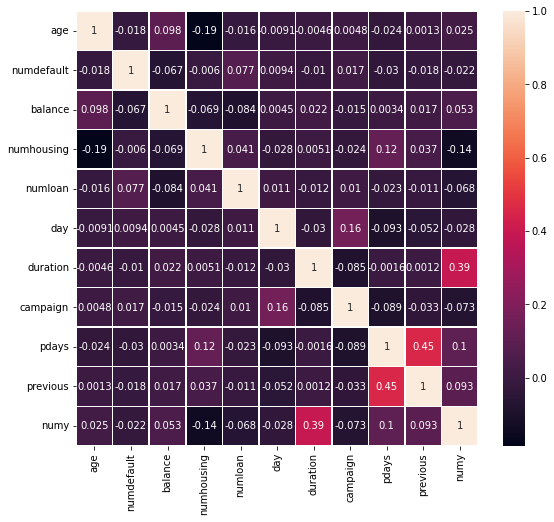

In [ ]:
plt.figure(figsize=(9,8))
sns.heatmap(corr_matrix, 
            annot=True,
            linewidths=.5)

plt.show()

In [ ]:
corr_matrix.style.background_gradient(cmap='Blues')

,age,numdefault,balance,numhousing,numloan,day,duration,campaign,pdays,previous,numy
age,1.000000,-0.017879,0.097783,-0.185513,-0.015655,-0.009120,-0.004648,0.004760,-0.023758,0.001288,0.025155
numdefault,-0.017879,1.000000,-0.066745,-0.006025,0.077234,0.009424,-0.010021,0.016822,-0.029979,-0.018329,-0.022419
balance,0.097783,-0.066745,1.000000,-0.068768,-0.084350,0.004503,0.021560,-0.014578,0.003435,0.016674,0.052838
numhousing,-0.185513,-0.006025,-0.068768,1.000000,0.041323,-0.027982,0.005075,-0.023599,0.124178,0.037076,-0.139173
numloan,-0.015655,0.077234,-0.084350,0.041323,1.000000,0.011370,-0.012412,0.009980,-0.022754,-0.011043,-0.068185
day,-0.009120,0.009424,0.004503,-0.027982,0.011370,1.000000,-0.030206,0.162490,-0.093044,-0.051710,-0.028348
duration,-0.004648,-0.010021,0.021560,0.005075,-0.012412,-0.030206,1.000000,-0.084570,-0.001565,0.001203,0.394521
campaign,0.004760,0.016822,-0.014578,-0.023599,0.009980,0.162490,-0.084570,1.000000,-0.088628,-0.032855,-0.073172
pdays,-0.023758,-0.029979,0.003435,0.124178,-0.022754,-0.093044,-0.001565,-0.088628,1.000000,0.454820,0.103621
previous,0.001288,-0.018329,0.016674,0.037076,-0.011043,-0.051710,0.001203,-0.032855,0.454820,1.000000,0.093236


## <font color="#333F49">**Cambio de nombres de columnas** <font>

El objetivo es facilitar la lectura de los datos, mejorando la experiencia del cliente, clienta final.

In [ ]:
df3 = df1.copy(deep=False)

In [ ]:
df3.columns=['edad', 'ocupacion', 'estadocivil', 'estudios', 'descubierto', 'saldoanual',
            'hipoteca', 'prestamo', 'canalcontacto', 'dia', 'mes', 'duracion', 'contactosactuales',
            'contactoanterior', 'contactosprevios', 'contrata', 'contratanum']

## <font color="#333F49">**Visualizar EDA con Pandas Profiling** <font>

### Actualizar el módulo de Pandas Profiling


In [ ]:
!pip install -U pandas-profiling

### Habilitar el módulo Pandas Profiling

In [ ]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


### Generar el reporte

In [ ]:
from pandas_profiling import ProfileReport
ProfileReport(df3)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Análisis previos:**  <font color="#0A66C2"><h10>**outliers (PyCaret)** <font>

In [ ]:
dfout = df3.copy(deep=False)

## <font color="#333F49">**Configurar el entorno** <font>

In [ ]:
from pycaret.anomaly import *

In [ ]:
s = setup(data = dfout,
          session_id = 123,
          ordinal_features = {'estudios':['primary', 'secondary', 'tertiary'],
                              'ocupacion':['unemployed', 'student', 'housemaid',
                                           'services','blue-collar','admin.',
                                           'technician','entrepreneur',  
                                            'self-employed', 'management','retired']
                              },
          ignore_features = ['contrata'],
          normalize = True,
          normalize_method = 'zscore',
          remove_multicollinearity = True, 
          multicollinearity_threshold = 0.75,
          remove_perfect_collinearity = True)

,Description,Value
0,session_id,123
1,Original Data,"(45211, 17)"
2,Missing Values,False
3,Numeric Features,7
4,Categorical Features,9
5,Ordinal Features,True
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(45211, 29)"
9,CPU Jobs,-1


In [ ]:
get_config ('X').columns

Index(['edad', 'ocupacion', 'estudios', 'saldoanual', 'dia', 'duracion',
       'contactosactuales', 'contactoanterior', 'contactosprevios',
       'estadocivil_divorced', 'estadocivil_married', 'descubierto_1',
       'hipoteca_0', 'prestamo_1', 'canalcontacto_others',
       'canalcontacto_telephone', 'mes_apr', 'mes_aug', 'mes_dec', 'mes_feb',
       'mes_jan', 'mes_jul', 'mes_jun', 'mes_mar', 'mes_may', 'mes_nov',
       'mes_oct', 'mes_sep', 'contratanum_1'],
      dtype='object')

## <font color="#333F49">**Creación del modelo** <font>

In [ ]:
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pyod.models.cblof.CBLOF
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


In [ ]:
iforest = create_model('iforest',
                       fraction = 0.05)

In [ ]:
r = assign_model(iforest)
r

,edad,ocupacion,estadocivil,estudios,descubierto,saldoanual,hipoteca,prestamo,canalcontacto,dia,mes,duracion,contactosactuales,contactoanterior,contactosprevios,contrata,contratanum,Anomaly,Anomaly_Score
0,58,management,married,tertiary,0,2143,1,0,others,5,may,261,1,-1,0,no,0,0,-0.085046
1,44,technician,single,secondary,0,29,1,0,others,5,may,151,1,-1,0,no,0,0,-0.117974
2,33,entrepreneur,married,secondary,0,2,1,1,others,5,may,76,1,-1,0,no,0,0,-0.086548
3,47,blue-collar,married,secondary,0,1506,1,0,others,5,may,92,1,-1,0,no,0,0,-0.126547
4,33,technician,single,secondary,0,1,0,0,others,5,may,198,1,-1,0,no,0,0,-0.108942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,0,825,0,0,cellular,17,nov,977,3,-1,0,yes,1,0,-0.041059
45207,71,retired,divorced,primary,0,1729,0,0,cellular,17,nov,456,2,-1,0,yes,1,1,0.015870
45208,72,retired,married,secondary,0,5715,0,0,cellular,17,nov,1127,5,184,3,yes,1,1,0.053616
45209,57,blue-collar,married,secondary,0,668,0,0,telephone,17,nov,508,4,-1,0,no,0,0,-0.054542


In [ ]:
r['Anomaly'].sum ()

2261

In [ ]:
r

,edad,ocupacion,estadocivil,estudios,descubierto,saldoanual,hipoteca,prestamo,canalcontacto,dia,mes,duracion,contactosactuales,contactoanterior,contactosprevios,contrata,contratanum,Anomaly,Anomaly_Score
0,58,management,married,tertiary,0,2143,1,0,others,5,may,261,1,-1,0,no,0,0,-0.085046
1,44,technician,single,secondary,0,29,1,0,others,5,may,151,1,-1,0,no,0,0,-0.117974
2,33,entrepreneur,married,secondary,0,2,1,1,others,5,may,76,1,-1,0,no,0,0,-0.086548
3,47,blue-collar,married,secondary,0,1506,1,0,others,5,may,92,1,-1,0,no,0,0,-0.126547
4,33,technician,single,secondary,0,1,0,0,others,5,may,198,1,-1,0,no,0,0,-0.108942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,0,825,0,0,cellular,17,nov,977,3,-1,0,yes,1,0,-0.041059
45207,71,retired,divorced,primary,0,1729,0,0,cellular,17,nov,456,2,-1,0,yes,1,1,0.015870
45208,72,retired,married,secondary,0,5715,0,0,cellular,17,nov,1127,5,184,3,yes,1,1,0.053616
45209,57,blue-collar,married,secondary,0,668,0,0,telephone,17,nov,508,4,-1,0,no,0,0,-0.054542


## <font color="#333F49">**Guardar el modelo** <font>

In [ ]:
from google.colab import files
r.to_csv('Anomaly_tarea_01.csv') 
files.download('Anomaly_tarea_01.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
save_model (iforest,'/content/Anomaly_tarea_01_iforest')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True,
                                       features_todrop=['contrata'],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='UNSUPERVISED_DUMMY_TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='most frequent',
                                 fill_value_categorical=None,
                                 fill_value_nume...
                  Fix_multicollinearity(correlation_with_target_preference=None,
                                        correlation_with_target_threshold=0.0,
                                        target_variable='UNSUPERVISED_DUMMY_TARGET',
                       

In [ ]:
files.download('Anomaly_tarea_01_iforest.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Conclusiones**: <font color="#0A66C2"><h10>**Primeras áreas de mejora detectadas** <font> 

El Ánalisis Explotario de los datos nos marca algunas pautas a tener en cuenta.

<font color="#0A66C2"><h10>**Destacamos a nivel de negocio las siguientes** <font>:
- **Ratio de éxito esperado.** 
En la anterior campaña se alcanzó un umbral de éxito en la contratación del **3,3%**.


- **Ausencia de segmentaciones.** 
Nos llama la atención que no haya una o más de una segmentación de los y las clientas en función de los depósitos o vinculación con la entidad. Sería conveniente que se recogiese en futuros análisis para entre otras cuestiones,ponderar también si los esfuerzos en materia de gestión de clientes, clientas están alcanzando los objetivos marcados.


- **Segmentación por uso de canales.**  
El uso de las oficinas por los y las clientas es cada vez menor, no obstante, todavía habrá clientes y clientas que quieran establecer la relación con nuestra entidad de manera presencial, acudiendo a las sucursales, tomando el pulso a nuestros, nuestras gestoras. Medir el impacto o no de este tipo de campañas de telemarketing, marketing digital también sería oportuno que contase con una segmentación en función de los canales de uso. 

- **Calidad de los datos.**  
Revisar los procesos de obtención de datos para este tipo de campañas. En un momento en que los buzones de correo electrónico, llamadas teléfonicas desde departamentos,pruncipalmente de empresas de telecomunicaciones, energéticas, debemos centrar muy bien el "tiro" de las mismas para no generar entre nuestros y nuestras propias clientas elementos de rechazo que pudieran traducirse en una pérdida de vinculación con la entidad. **El hecho que más del 80% de las observaciones tengan un valor de "desconocido" en la anterior campaña** es un claro indicador de la necesidad de implementar acciones de mejora en este apartado de la calidad de los datos.

<font color="#0A66C2"><h10>**Datos observados antes de definir los modelos de clasificación** <font>:
- **13020 observaciones no tenían asignado un canal de contacto** 

- **2% de las observaciones, en una variable binario como es el descubierto son respuestas afirmativas**. En el proceso de creación del entorno en PyCaret se tendrá en cuenta este aspecto, invocando al parámetro <font color="#0A66C2"><h10>remove_perfect_collinearity = True <font> 


- **1857 observaciones no tenían asignado un nivel de estudio**. Variable que se ha considerado ordinal y que en la imputación de NaN se han asigandos a "secondary".

- **288 observaciones no tenían asignado un nivel de ocupación**. Variable que se ha considerado ordinal y que en la imputación de NaN se han asigandos a "technician".

- **A priori no se detecta correlación entre las variables numércias**. No obstante, la implementación del reporte de Pandas Profiling reveleva correlación entre variables numércias y categóricas que con la creación del entorno del modelo en PyCaret se mitigirán, invocando al parámetro <font color="#0A66C2"><h10>remove_multicollinearity = True <font>.

